<a href="https://colab.research.google.com/github/pierreduke/123/blob/main/train_celeb_densenet121.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive._mount('/content/drive')

Mounted at /content/drive


**Unzip dataset**

In [ ]:
!unzip /content/drive/MyDrive/DatasetCELEB_train.zip

**Cài đặt thư viện model**

In [2]:
# ! pip install git+https://github.com/qubvel/classification_models.git
# ! pip install git+https://github.com/qubvel/segmentation_models

**1) Khai báo các thư viện sử dụng**

In [4]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Sequential



> **1.1) Model thông thường (ResNet, DenseNet, Xception, ResNext)**



In [ ]:
from tensorflow.keras.applications import DenseNet121
baseModel = DenseNet121(weights="imagenet", include_top=False, input_tensor=Input(shape=(224,224,3)))
headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(7,7))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(512, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(256, activation="relu")(headModel)
headModel = Dense(2, activation="softmax")(headModel)
model = Model(inputs=baseModel.input, outputs=headModel)
model.summary()



> **1.2) EfficientNet Model**



In [ ]:
# efficient_net = EfficientNetB1(
#     weights = 'imagenet',
#     input_shape = (224, 224, 3),
#     include_top = False,
#     pooling = 'max'
# )

# model = Sequential()
# model.add(efficient_net)
# model.add(Dense(units = 512, activation = 'relu'))
# model.add(Dropout(0.5))
# model.add(Dense(units = 128, activation = 'relu'))
# model.add(Dense(units = 2, activation = 'softmax'))
# model.summary()

In [14]:
model.compile(optimizer = Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

**2) Khởi tạo đường dẫn, checkpoint và callbacks**

In [7]:
train_path = '/content/DatasetCELEB_train/train'
val_path = '/content/DatasetCELEB_train/val'


In [8]:
checkpoint_filepath = '/content/drive/MyDrive/model_checkpoint/'
print('Creating Directory: ' + checkpoint_filepath)
os.makedirs(checkpoint_filepath, exist_ok=True)

Creating Directory: /content/drive/MyDrive/model_checkpoint/


In [9]:
custom_callbacks = [
    EarlyStopping(
        monitor = 'val_loss',
        mode = 'min',
        patience = 5,
        verbose = 1
    ),
    ModelCheckpoint(
        filepath = os.path.join(checkpoint_filepath, 'DenseNet169_CELEB.h5'),
        monitor = 'val_loss',
        mode = 'min',
        verbose = 1,
        save_best_only = True
    )
]

**3) ImageDataGenerator**

In [12]:
train_datagen = ImageDataGenerator(
    rescale = 1/255,
    rotation_range = 10,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    shear_range = 0.2,
    zoom_range = 0.1,
    horizontal_flip = True,
    fill_mode = 'nearest'
)
train_generator = train_datagen.flow_from_directory(
    directory = train_path,
    target_size = (224,224),
    color_mode = "rgb",
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True
)

val_datagen = ImageDataGenerator(
    rescale = 1/255    #rescale the tensor values to [0,1]
)
val_generator = val_datagen.flow_from_directory(
    directory = val_path,
    target_size = (224,224),
    color_mode = "rgb",
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True
)

Found 77703 images belonging to 2 classes.
Found 19426 images belonging to 2 classes.


In [13]:
len(train_generator)

2429

**4) Huấn luyện**

In [15]:
num_epochs = 20

In [16]:
H = model.fit_generator(
    train_generator,
    epochs = num_epochs,
    steps_per_epoch = len(train_generator),
    validation_data = val_generator,
    validation_steps = len(val_generator),
    callbacks = custom_callbacks
)
print(H.history)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys


Epoch 1/20
2429/2429 [==============================] - ETA: 0s - loss: 0.1296 - accuracy: 0.9463
Epoch 00001: val_loss improved from inf to 0.05296, saving model to /content/drive/MyDrive/model_checkpoint/ResNet50_CELEB.h5
2429/2429 [==============================] - 833s 335ms/step - loss: 0.1296 - accuracy: 0.9463 - val_loss: 0.0530 - val_accuracy: 0.9815
Epoch 2/20
2429/2429 [==============================] - ETA: 0s - loss: 0.0482 - accuracy: 0.9825
Epoch 00002: val_loss improved from 0.05296 to 0.03772, saving model to /content/drive/MyDrive/model_checkpoint/ResNet50_CELEB.h5
2429/2429 [==============================] - 811s 334ms/step - loss: 0.0482 - accuracy: 0.9825 - val_loss: 0.0377 - val_accuracy: 0.9869
Epoch 3/20
2429/2429 [==============================] - ETA: 0s - loss: 0.0327 - accuracy: 0.9883
Epoch 00003: val_loss did not improve from 0.03772
2429/2429 [==============================] - 810s 333ms/step - loss: 0.0327 - accuracy: 0.9883 - val_loss: 0.0718 - val_accur

**5) Plot đồ thị train**

In [17]:
import matplotlib.pyplot as plt
acc = H.history['accuracy']
val_acc = H.history['val_accuracy']
loss = H.history['loss']
val_loss = H.history['val_loss']

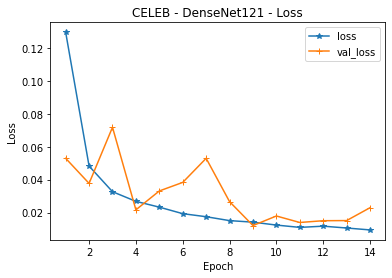

In [38]:
import matplotlib.pyplot as plt
epochs = range(1, len(acc) + 1)

plt.plot(epochs, H.history['loss'], label='loss', marker="*")
plt.plot(epochs, H.history['val_loss'], label='val_loss', marker="+")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('CELEB - DenseNet121 - Loss')
plt.legend()
plt.show()

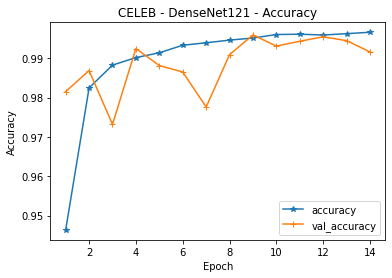

In [39]:
plt.plot(epochs, H.history['accuracy'], label='accuracy', marker="*")
plt.plot(epochs, H.history['val_accuracy'], label='val_accuracy', marker="+")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('CELEB - DenseNet121 - Accuracy')
plt.legend()
plt.show()



---



---



---



---



---



---
**Phần test**


---

---



---



---



---






In [22]:
!unzip /content/drive/MyDrive/DatasetCELEB_test.zip

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
  inflating: DatasetCELEB_test/real/5450.jpg  
  inflating: DatasetCELEB_test/real/5451.jpg  
  inflating: DatasetCELEB_test/real/5452.jpg  
  inflating: DatasetCELEB_test/real/5453.jpg  
  inflating: DatasetCELEB_test/real/5454.jpg  
  inflating: DatasetCELEB_test/real/5455.jpg  
  inflating: DatasetCELEB_test/real/5456.jpg  
  inflating: DatasetCELEB_test/real/5457.jpg  
  inflating: DatasetCELEB_test/real/5458.jpg  
  inflating: DatasetCELEB_test/real/5459.jpg  
  inflating: DatasetCELEB_test/real/546.jpg  
  inflating: DatasetCELEB_test/real/5460.jpg  
  inflating: DatasetCELEB_test/real/5461.jpg  
  inflating: DatasetCELEB_test/real/5462.jpg  
  inflating: DatasetCELEB_test/real/5463.jpg  
  inflating: DatasetCELEB_test/real/5464.jpg  
  inflating: DatasetCELEB_test/real/5465.jpg  
  inflating: DatasetCELEB_test/real/5466.jpg  
  inflating: DatasetCELEB_test/real/5467.jpg  
  inflating: DatasetCELEB_test/real/5468.jpg  
  in

**1) Khai báo thư viện**

In [27]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

**2) Khai báo tệp test**

In [28]:
test_path = '/content/DatasetCELEB_test'
test_datagen = ImageDataGenerator(
    rescale = 1/255    #rescale the tensor values to [0,1]
)

test_generator = test_datagen.flow_from_directory(
    directory = test_path,
    classes=['real', 'fake'],
    target_size = (224,224),
    color_mode = "rgb",
    class_mode = None,
    batch_size = 1,
    shuffle = False
)

Found 33384 images belonging to 2 classes.


**3) Load mô hình (Model trên keras.application) hoặc trọng số (Class Model)**



> 3.1) Đối với model keras.application (ResNet50, ResNet50V2, DenseNet121, DenseNet169, Xception)



In [ ]:
new_model = load_model('/content/drive/MyDrive/model_checkpoint/DenseNet121_CELEB.h5')



> 3.2. Đối với Class Model (ResNeXt50)



In [ ]:
# !pip install git+https://github.com/qubvel/classification_models.git
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Dense
# from tensorflow.keras.layers import AveragePooling2D
# from tensorflow.keras.layers import Flatten
# from tensorflow.keras.layers import Dropout
# from classification_models.tfkeras import Classifiers

# ResNeXt50, preprocess_input = Classifiers.get('resnext50')
# baseModel = ResNeXt50(include_top = False, input_shape=(224, 224, 3), weights='imagenet')
# headModel = baseModel.output
# headModel = Dense(512, activation="relu")(headModel)
# headModel = Dropout(0.5)(headModel)
# headModel = Dense(256, activation="relu")(headModel)
# headModel = AveragePooling2D(pool_size=(7,7))(headModel)
# headModel = Flatten(name="flatten")(headModel)
# headModel = Dense(2, activation="softmax")(headModel)
# model = Model(inputs=baseModel.input, outputs=headModel)
# model.load_weights('/content/drive/MyDrive/checkpoint/MIX_ResNext50.h5')



> 3.3) Đối với EfficientNet model



In [ ]:
# from tensorflow.keras.layers import Input
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Dense
# from tensorflow.keras.layers import AveragePooling2D
# from tensorflow.keras.layers import Flatten
# from tensorflow.keras.layers import Dropout
# from tensorflow.keras.applications import EfficientNetB1
#
# baseModel = EfficientNetB1(weights="imagenet", include_top=False, input_tensor=Input(shape=(224,224,3)))
# headModel = baseModel.output
# headModel = Dense(512, activation="relu")(headModel)
# headModel = Dropout(0.5)(headModel)
# headModel = Dense(256, activation="relu")(headModel)
# headModel = AveragePooling2D(pool_size=(7,7))(headModel)
# headModel = Flatten(name="flatten")(headModel)
# headModel = Dense(2, activation="softmax")(headModel)
# model = Model(inputs=baseModel.input, outputs=headModel)
# model.load_weights('path_to_efficientnet', by_name=True)

**4) Predict tệp dataset**

In [29]:
test_generator.reset()
preds = new_model.predict(test_generator, verbose = 1)

33384/33384 [==============================] - 691s 21ms/step


In [30]:
print(preds)

[[2.7451779e-11 1.0000000e+00]
 [1.2414612e-06 9.9999881e-01]
 [9.6143211e-08 9.9999988e-01]
 ...
 [1.0000000e+00 4.8478757e-08]
 [9.9991798e-01 8.2054430e-05]
 [9.9999893e-01 1.0704383e-06]]


**5) Encoder True Labels (Nên kiểm tra nhãn trước, [0 1] thì set 'real, fake'**

In [24]:
from keras.utils import np_utils
from imutils import paths
import numpy as np
import pickle
from sklearn.preprocessing import LabelEncoder
import os

path_tests = list(paths.list_images('/content/DatasetCELEB_test'))
labels_test = []

for path_test in path_tests:
	label2 = path_test.split(os.path.sep)[-2]
	labels_test.append(label2)
le = LabelEncoder()
labels_test = le.fit_transform(labels_test)
labels_test = np_utils.to_categorical(labels_test, 2)

f = open('le.pickle', "wb")
f.write(pickle.dumps(le))
f.close()

In [26]:
print(labels_test)

[[0. 1.]
 [0. 1.]
 [0. 1.]
 ...
 [1. 0.]
 [1. 0.]
 [1. 0.]]


**6) Classification Report**

In [31]:
from sklearn.metrics import classification_report

test = np.argmax(labels_test, axis=-1)
pred = np.argmax(preds, axis=-1)
print(classification_report(test, pred, target_names=le.classes_, digits = 5))

              precision    recall  f1-score   support

        fake    0.96381   0.98972   0.97659     15956
        real    0.99035   0.96597   0.97801     17428

    accuracy                        0.97732     33384
   macro avg    0.97708   0.97785   0.97730     33384
weighted avg    0.97767   0.97732   0.97733     33384



In [32]:
print(test)
print(pred)

[1 1 1 ... 0 0 0]
[1 1 1 ... 0 0 0]


**7) Confussion Matrix**

[[15792   164]
 [  593 16835]]


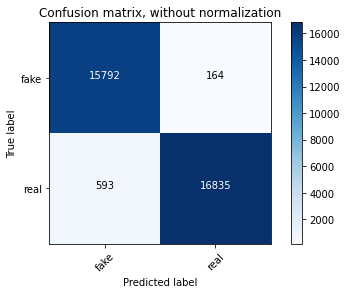

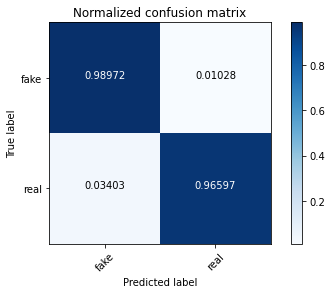

In [34]:
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(test, pred)
print(cnf_matrix)
import matplotlib.pyplot as plt
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1, keepdims = True)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.5f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
  
class_names = ['fake', 'real']
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')

plt.show()

**8) EER, TPR, FPR**

In [35]:
from sklearn.metrics import auc, roc_curve
fpr, tpr, _ = roc_curve(test, pred, pos_label=1)

fnr = 1 - tpr
fpr_eer = fpr[np.nanargmin(np.absolute((fnr - fpr)))]
fnr_eer = fnr[np.nanargmin(np.absolute((fnr - fpr)))]
eer = min(fpr_eer, fnr_eer)
print("tpr = ", tpr)
print("fpr = ", fpr)
print("eer = ", eer)

tpr =  [0.         0.96597429 1.        ]
fpr =  [0.         0.01027827 1.        ]
eer =  0.010278265229380797


**9) Đồ thị ROC**

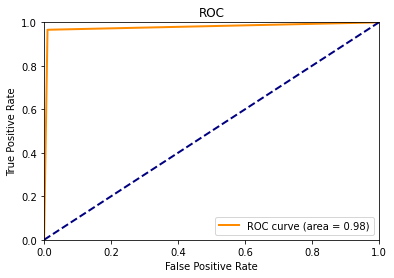

In [36]:
import matplotlib.pyplot as plt
from itertools import cycle
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % auc(fpr, tpr))
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

**10) Test trên 1 tệp ảnh riêng**







> 10.1) Face Dectector using cv2.dnn



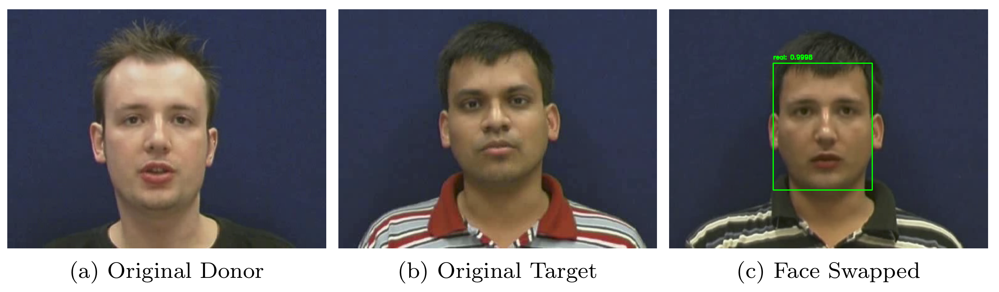

[1.5107061e-04 9.9984896e-01]




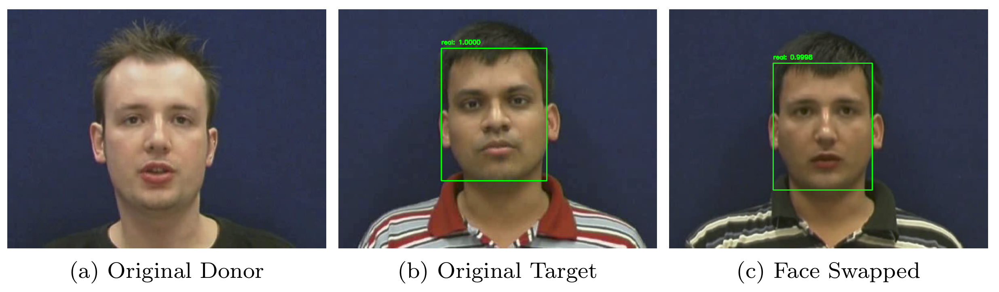

[1.5755994e-07 9.9999988e-01]




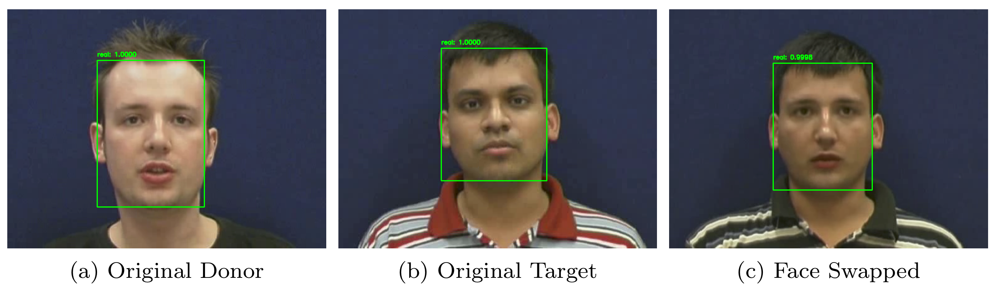

[2.4879905e-09 1.0000000e+00]




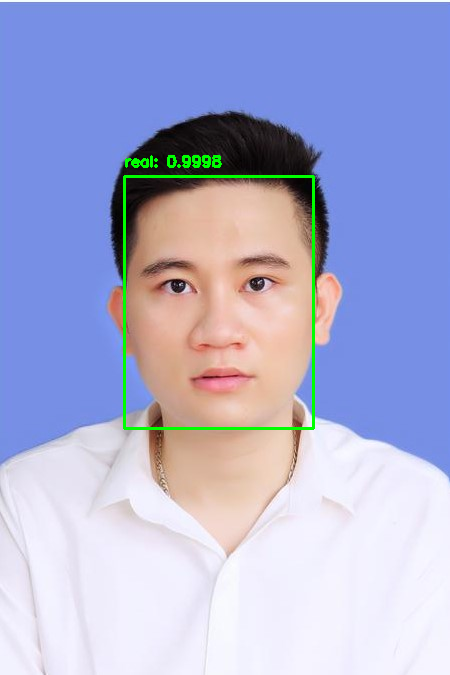

[1.5785776e-04 9.9984217e-01]




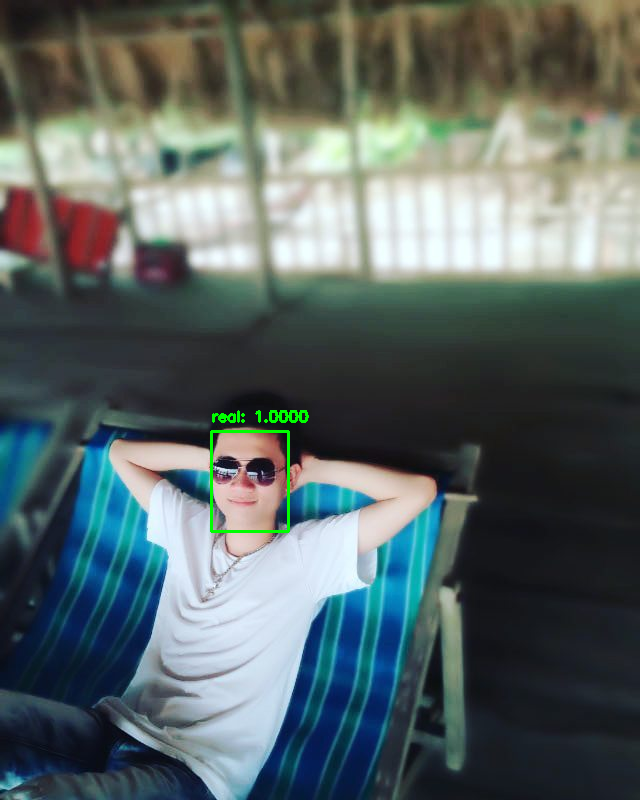

[4.870227e-09 1.000000e+00]




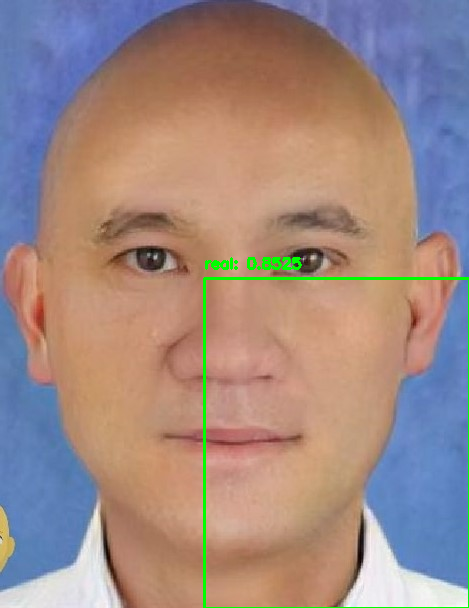

[0.14746101 0.852539  ]




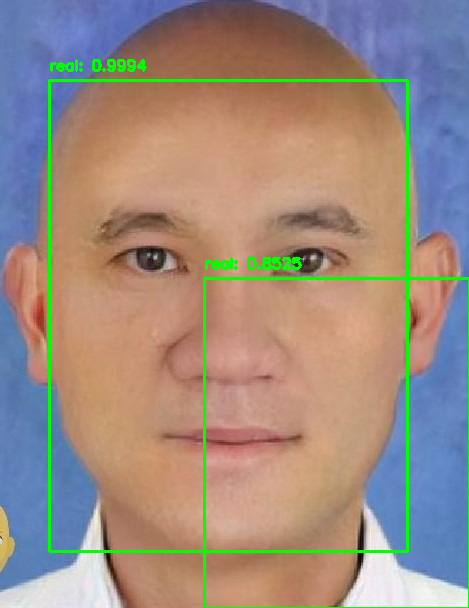

[5.958993e-04 9.994041e-01]




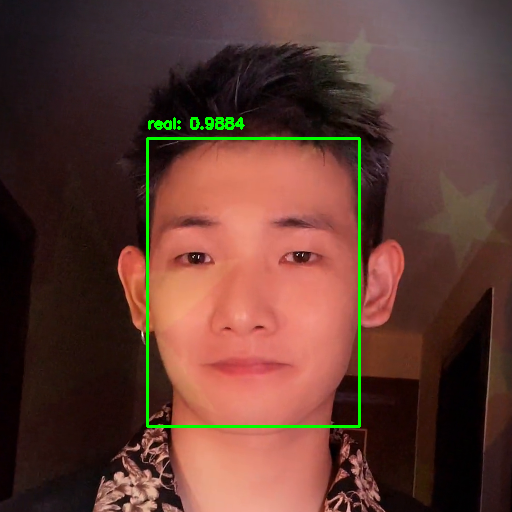

[0.0115789 0.9884211]




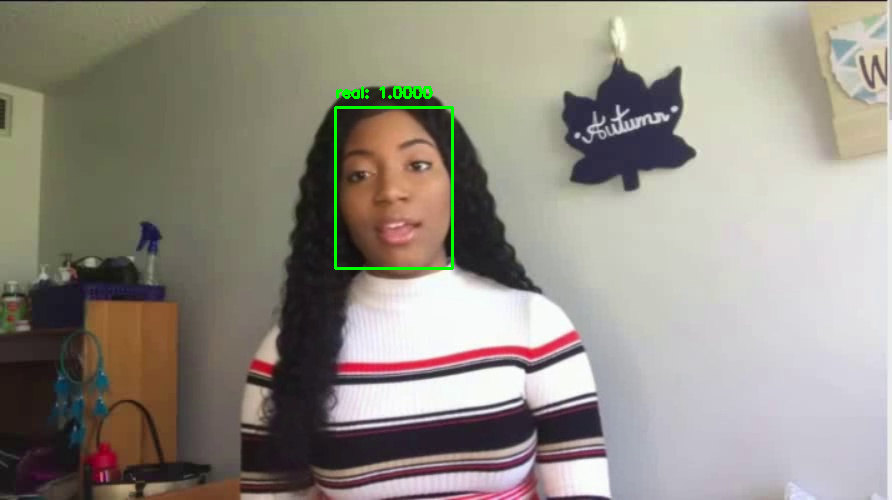

[5.2837895e-06 9.9999475e-01]




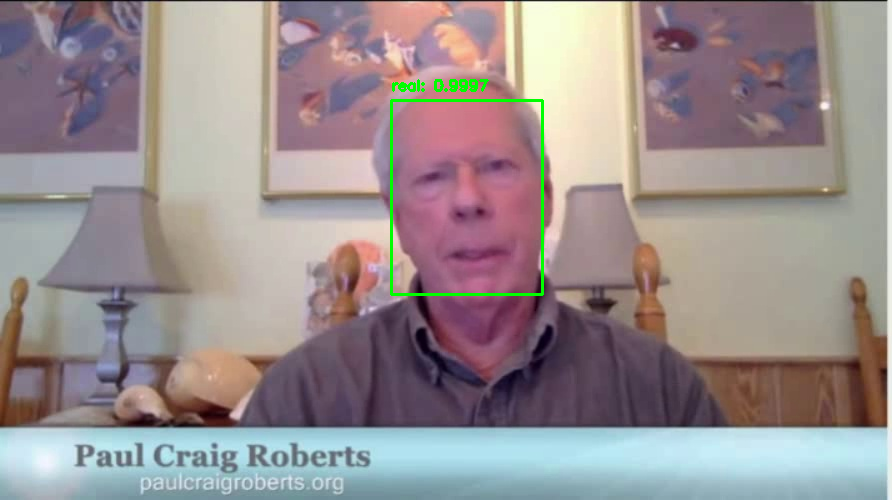

[3.1613023e-04 9.9968386e-01]




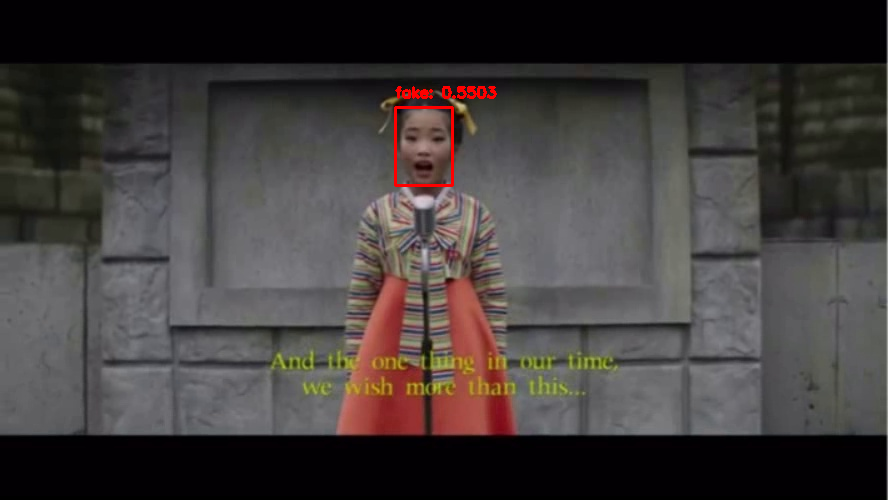

[0.55029684 0.44970316]




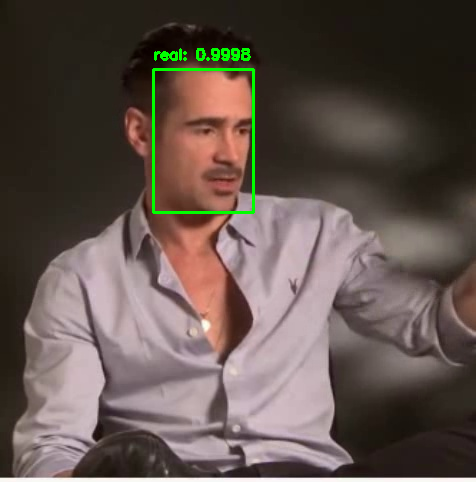

[2.1035710e-04 9.9978966e-01]




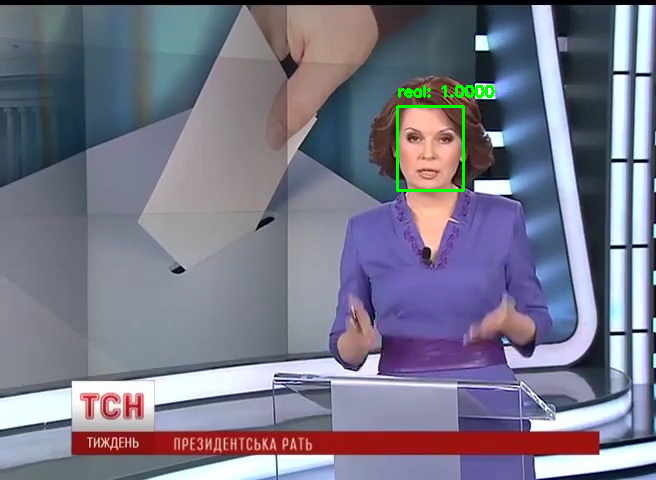

[5.1125343e-14 1.0000000e+00]




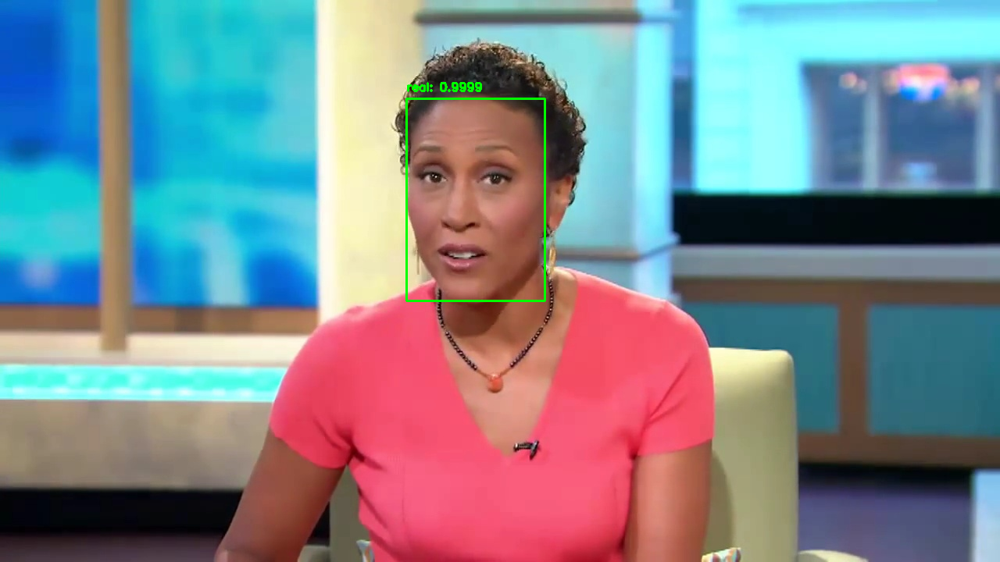

[9.1916285e-05 9.9990809e-01]




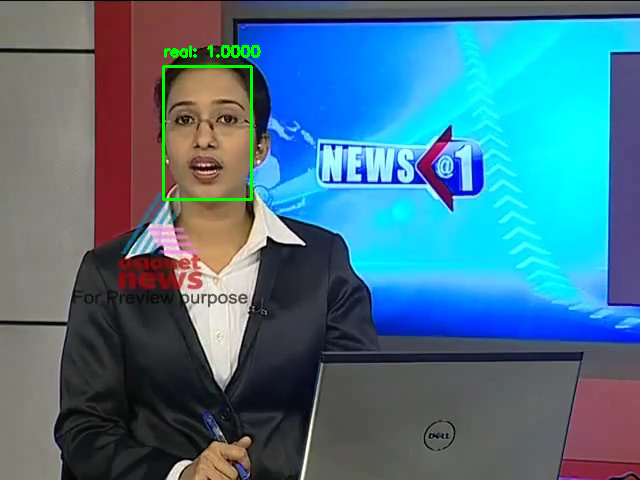

[5.025262e-14 1.000000e+00]




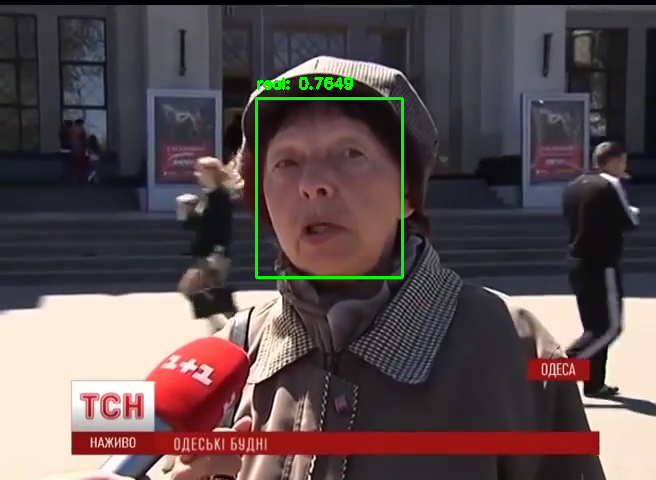

[0.23513742 0.76486254]




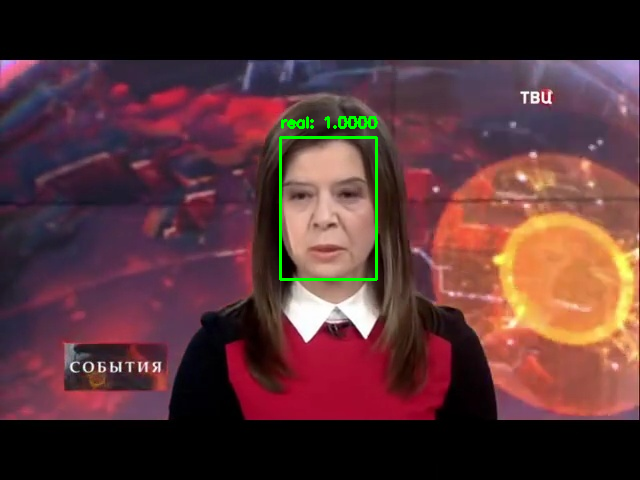

[3.6358228e-06 9.9999642e-01]




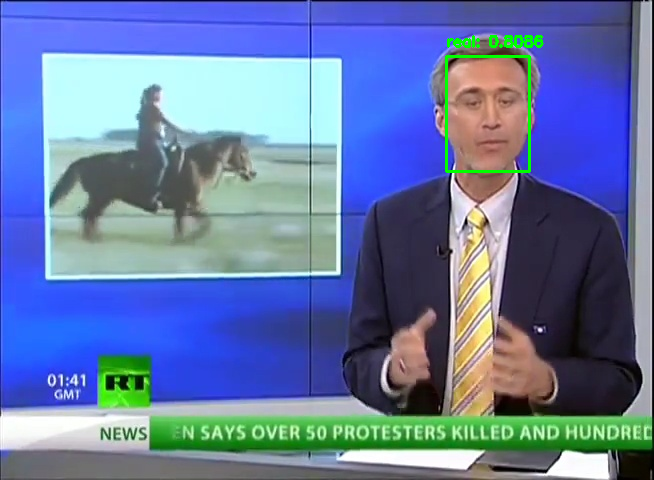

[0.19139425 0.8086058 ]




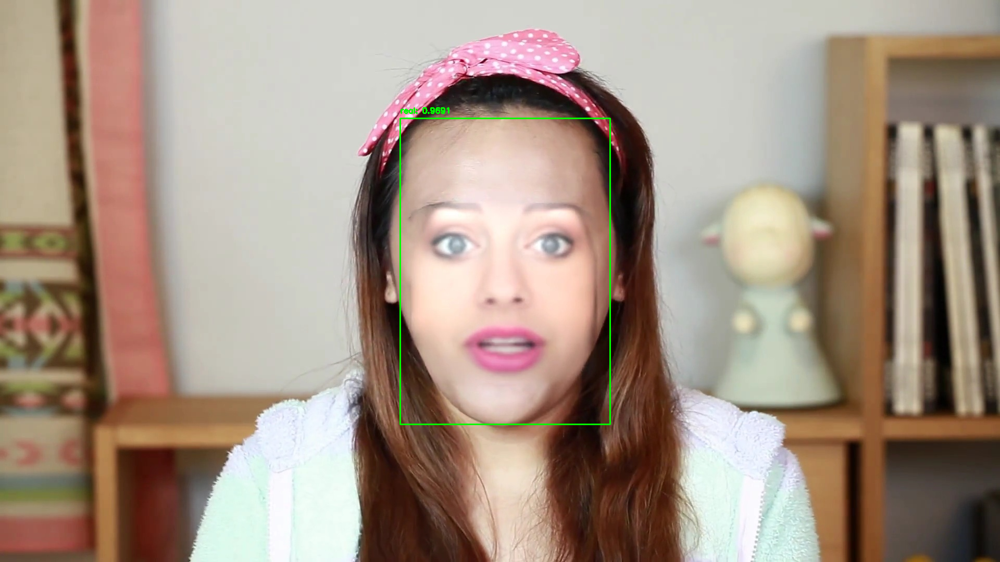

[0.0309032  0.96909684]




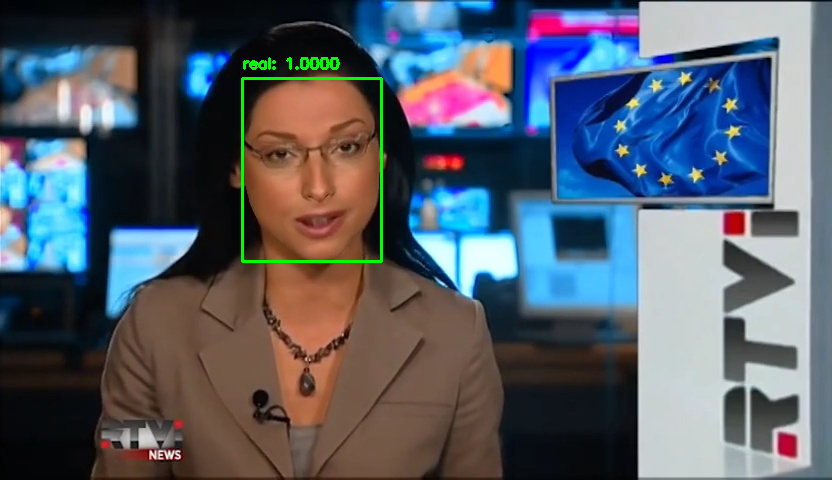

[1.6141732e-07 9.9999988e-01]




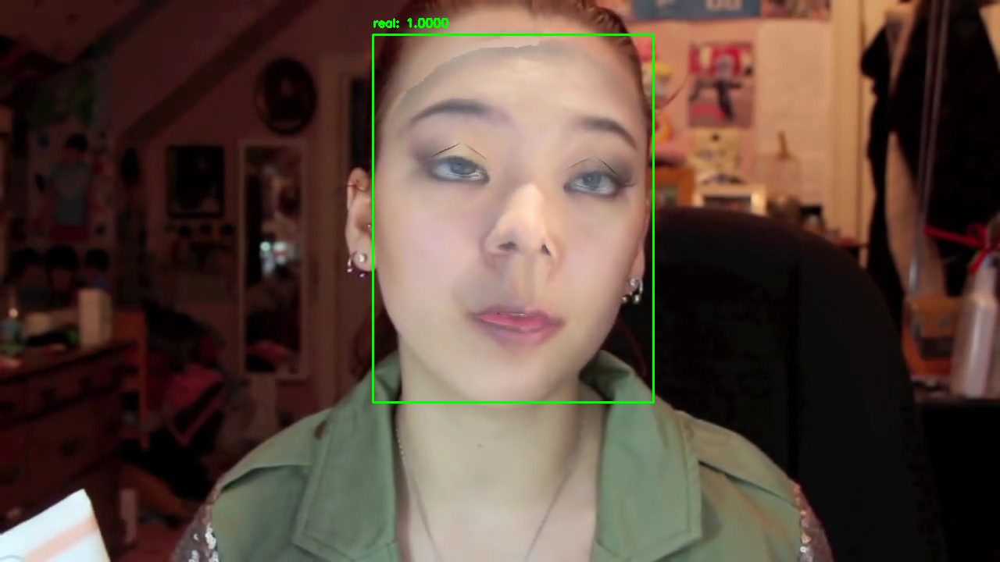

[3.0136650e-07 9.9999964e-01]




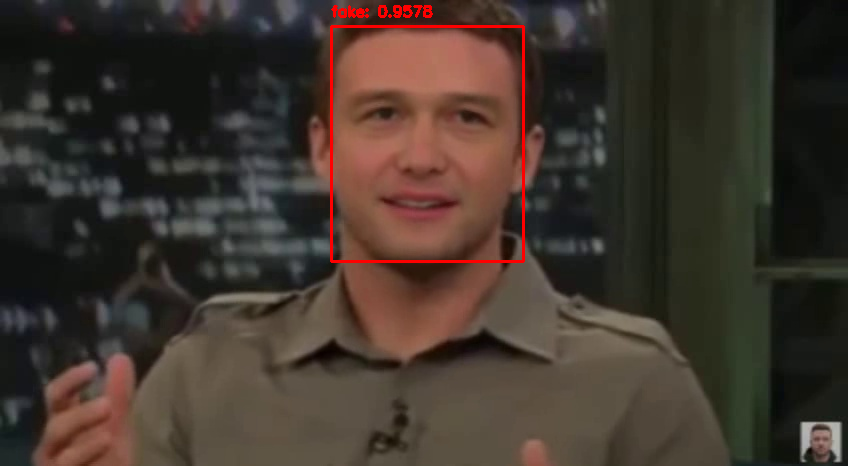

[0.95775265 0.04224729]




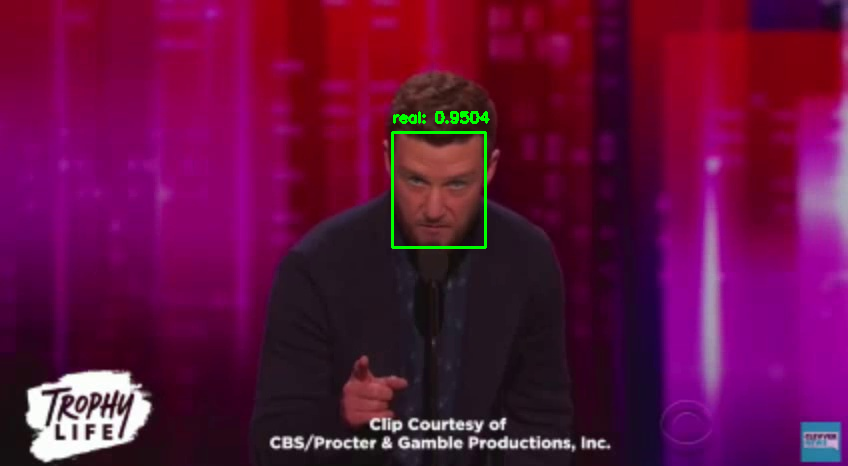

[0.04958001 0.95041996]




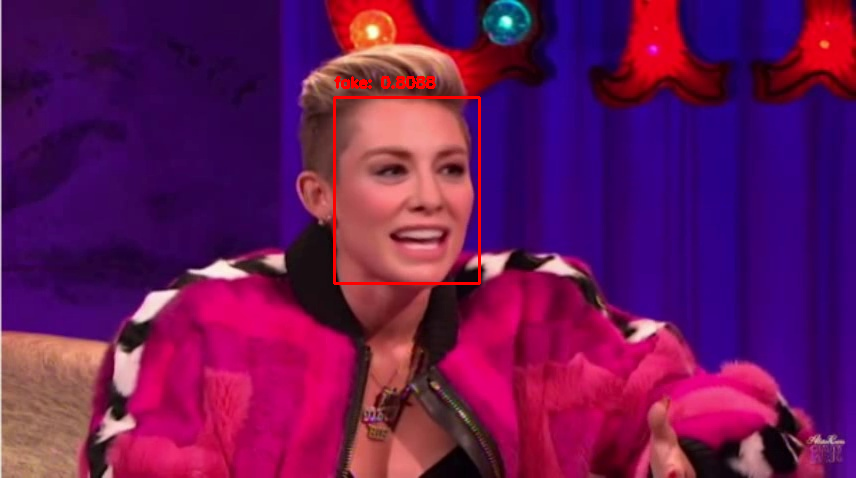

[0.80881417 0.19118583]




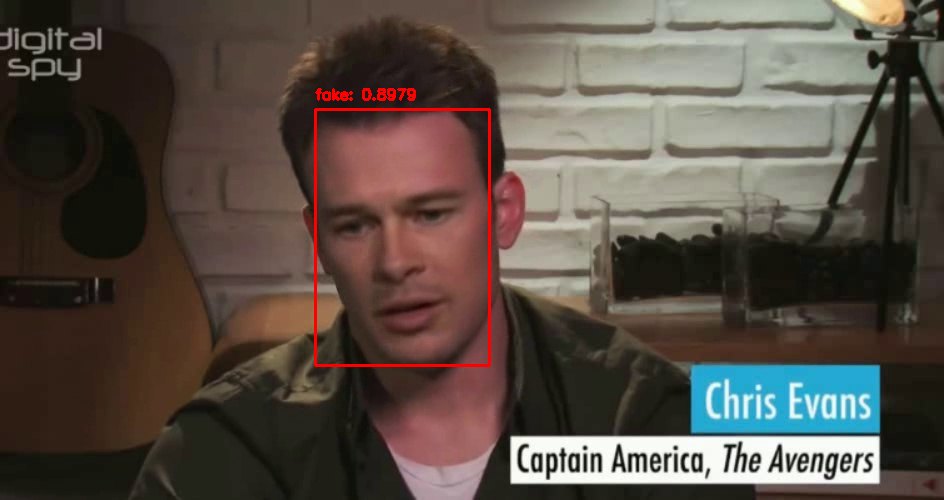

[0.8978897  0.10211031]




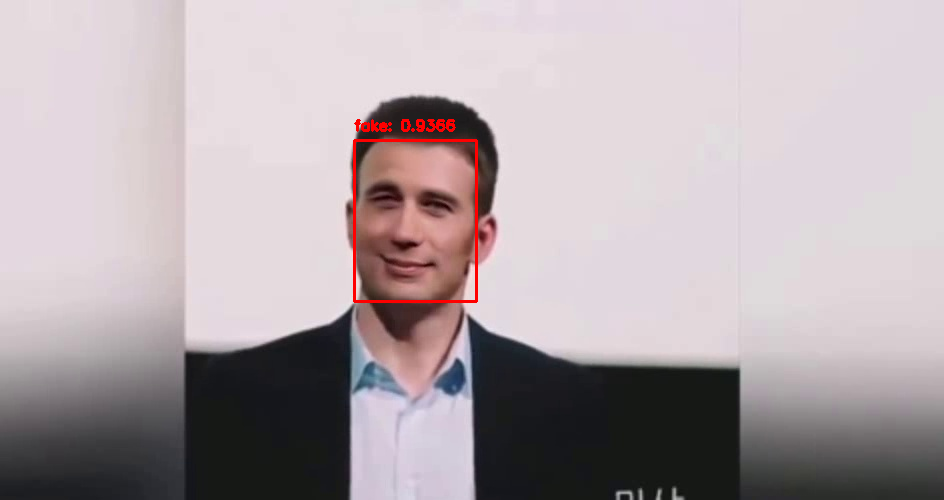

[0.93655217 0.0634478 ]




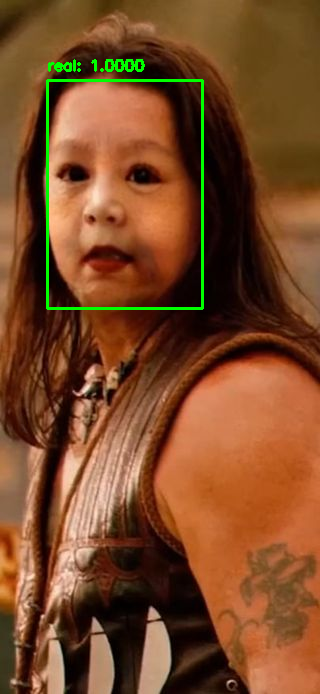

[4.399028e-05 9.999560e-01]




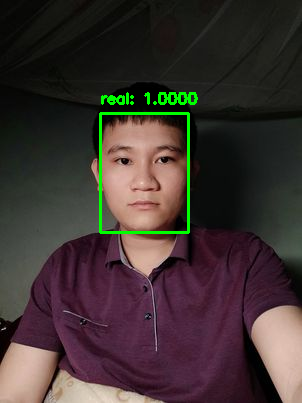

[2.9355517e-06 9.9999702e-01]




In [37]:
import cv2
import glob
from keras.preprocessing.image import img_to_array
from google.colab.patches import cv2_imshow
import pickle
import numpy as np

net = cv2.dnn.readNetFromCaffe('/content/drive/MyDrive/deploy.prototxt',
                               '/content/drive/MyDrive/res10_300x300_ssd_iter_140000.caffemodel')
folder = glob.glob('/content/drive/MyDrive/test_img/*.*')
for file in folder:
  frame = cv2.imread(file)
  (h, w) = frame.shape[:2]
  le = pickle.loads(open('/content/le.pickle', "rb").read())
  blob = cv2.dnn.blobFromImage(cv2.resize(frame, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))
  # Phat hien khuon mat
  net.setInput(blob)
  detections = net.forward()

  # Loop qua cac khuon mat
  for i in range(0, detections.shape[2]):
    confidence = detections[0, 0, i, 2]

    # Neu conf lon hon threshold
    if confidence > 0.5:
      box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
      (startX, startY, endX, endY) = box.astype("int")
      startX = max(0, startX)
      startY = max(0, startY)
      endX = min(w, endX)
      endY = min(h, endY)

      # Lay vung khuon mat
      face = frame[startY:endY, startX:endX]
      try:
        face = cv2.resize(face, (224,224))
      except Exception as e:
        continue
      face = face.astype("float") / 255.0
      face = img_to_array(face)
      face = np.expand_dims(face, axis=0)

      # Dua vao model de nhan dien fake/real
      face_preds = model.predict(face)[0]
      j = np.argmax(face_preds)
      label = le.classes_[j]

      # Ve hinh chu nhat quanh mat
      label = "{}: {:.4f}".format(label, face_preds[j])
      if (j==0):
        # Neu la fake thi ve mau do
        cv2.putText(frame, label, (startX, startY - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
        cv2.rectangle(frame, (startX, startY), (endX, endY), (0, 0, 255), 2)
      else:
        # Neu real thi ve mau xanh
        cv2.putText(frame, label, (startX, startY - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.rectangle(frame, (startX, startY), (endX, endY), (0,  255,0), 2)
      cv2_imshow(frame)
      print(face_preds)
      print('\n')
